EDA Machine Learning

In [14]:
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt

In [15]:
df=pd.read_csv(r'C:\Users\Fernando\Desktop\Proyecto 1\Proyecto-Individual-1-ML\data procesada para funciones\data_ml')

In [16]:
df.drop('Unnamed: 0',axis=1,inplace=True)

Comenzamos el EDA

In [17]:
df.info() #nulos en overview, runtime, status, tagline

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45464 entries, 0 to 45463
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   budget               45376 non-null  float64
 1   Id_Pelicula          45376 non-null  float64
 2   original_language    45365 non-null  object 
 3   overview             44435 non-null  object 
 4   popularity           45376 non-null  float64
 5   release_date         45376 non-null  object 
 6   revenue              45376 non-null  float64
 7   runtime              45130 non-null  float64
 8   status               45296 non-null  object 
 9   tagline              20398 non-null  object 
 10  title                45376 non-null  object 
 11  vote_average         45376 non-null  float64
 12  vote_count           45376 non-null  float64
 13  return               45376 non-null  float64
 14  release_year         45376 non-null  float64
 15  day_of_week_release  45376 non-null 

In [18]:
#df.fillna(0,inplace=True) # 0 parece un buen valor ya que pueden haber valores por ejemplo en coleccion nulos y si se les pone 0 se entiende que no tienen coleccion, al igual que tagline

In [23]:
df.describe()

,budget,Id_Pelicula,popularity,revenue,runtime,vote_average,vote_count,return,release_year,Id_coleccion,Id_genero_1,Id_genero_2,Id_genero_3,Id_produccion_1,Id_produccion_2,Id_produccion_3
count,4.546400e+04,45464.000000,45464.000000,4.546400e+04,45464.000000,45464.000000,45464.000000,4.546400e+04,45464.000000,45464.000000,45464.000000,45464.000000,45464.000000,45464.000000,45464.000000,45464.000000
mean,4.224412e+06,107818.006115,2.920793,1.120836e+07,93.489772,5.613184,109.883336,6.587652e+02,1988.025713,18170.892552,886.029056,1611.801337,1132.858415,7863.825598,6674.100937,2377.329931
std,1.742397e+07,112160.314769,6.005230,6.432950e+07,39.037472,1.929468,491.290577,7.462097e+04,90.788228,70671.206647,2851.836673,3760.945568,3233.455982,16281.322777,16219.367882,10624.898463
min,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000e+00,26262.500000,0.385718,0.000000e+00,85.000000,5.000000,3.000000,0.000000e+00,1978.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000e+00,59528.000000,1.127069,0.000000e+00,95.000000,6.000000,10.000000,0.000000e+00,2001.000000,0.000000,28.000000,18.000000,0.000000,1131.500000,0.000000,0.000000
75%,0.000000e+00,156205.750000,3.678005,0.000000e+00,107.000000,6.800000,34.000000,0.000000e+00,2010.000000,0.000000,37.000000,53.000000,18.000000,7281.000000,5062.750000,0.000000
max,3.800000e+08,469172.000000,547.488298,2.787965e+09,1256.000000,10.000000,14075.000000,1.239638e+07,2020.000000,480160.000000,10770.000000,10770.000000,10770.000000,96067.000000,96035.000000,95937.000000


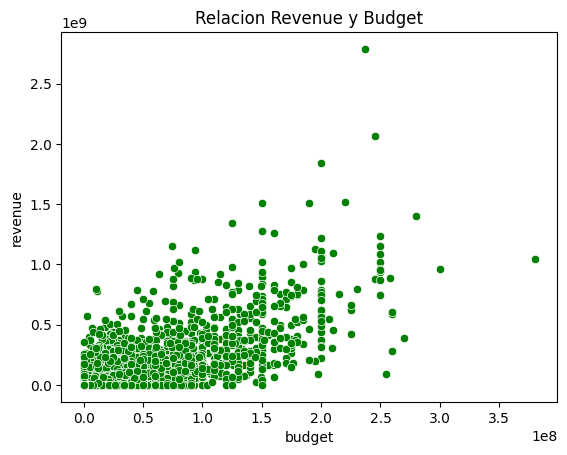

In [19]:
fig,ax=plt.subplots()
sns.scatterplot(x=df['budget'],y=df['revenue'],color='green')
plt.title('Relacion Revenue y Budget')
plt.show()

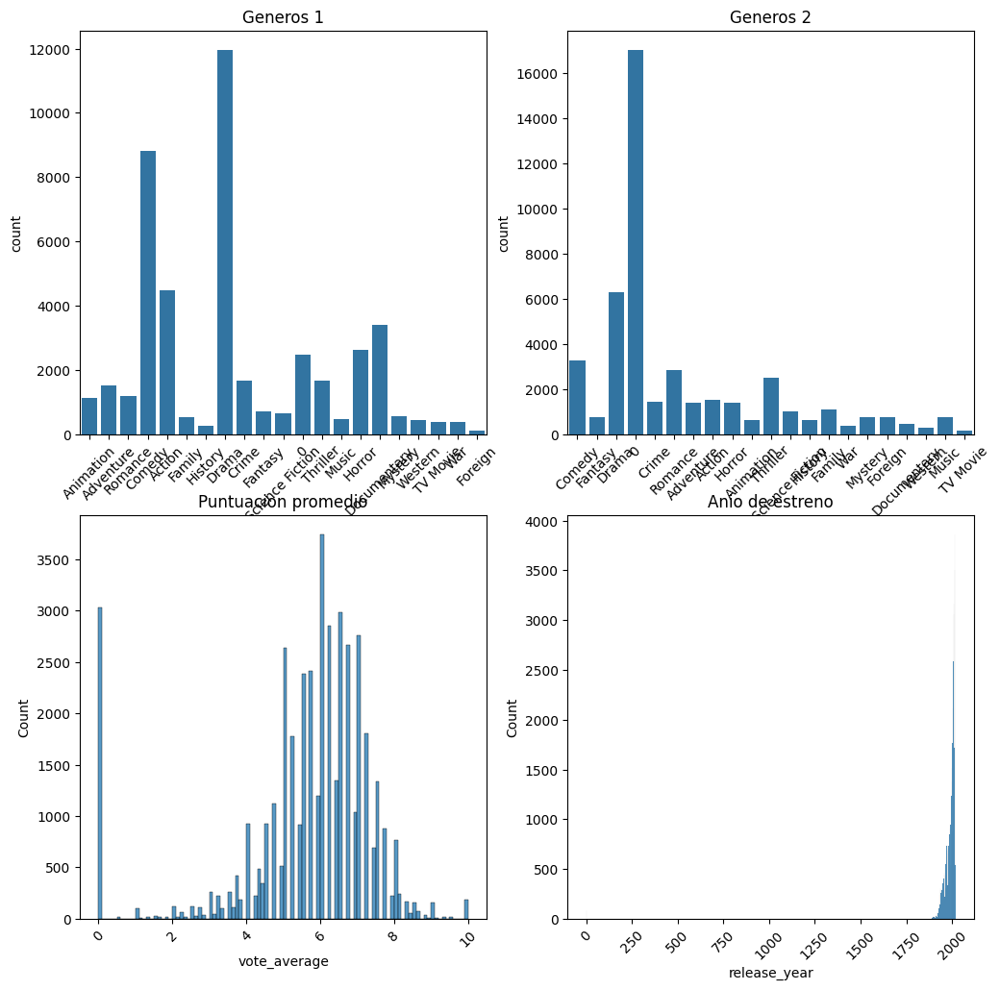

In [20]:
fig,axes=plt.subplots(2,2,figsize=(12,12))
sns.countplot(data=df,x='genero_1',ax=axes[0,0])
axes[0, 0].set_title('Generos 1')
axes[0, 0].tick_params(axis='x', rotation=45) 
sns.countplot(data=df,x='genero_2',ax=axes[0,1])
axes[0, 1].set_title('Generos 2')
axes[0, 1].tick_params(axis='x', rotation=45) 
sns.histplot(data=df,x='vote_average',ax=axes[1,0])
axes[1,0].set_title('Puntuacion promedio')
axes[1,0].tick_params(axis='x', rotation=45) 
sns.histplot(data=df,x='release_year',ax=axes[1,1])
axes[1, 1].set_title('Anio de estreno')
axes[1, 1].tick_params(axis='x', rotation=45) 

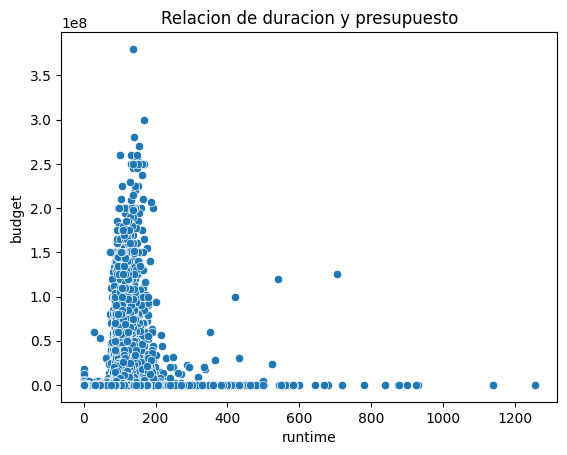

In [28]:
fig,ax=plt.subplots()
sns.scatterplot(df, x='runtime',y='budget')
plt.title('Relacion de duracion y presupuesto')
plt.show()

In [61]:

language_counts = df['original_language'].value_counts()
porcentaje_lenguaje = language_counts / language_counts.sum() * 100
porcentaje_lenguaje


original_language
en    70.829667
fr     5.360285
it     3.360901
ja     2.967183
de     2.371107
        ...    
la     0.002200
fy     0.002200
rw     0.002200
tg     0.002200
si     0.002200
Name: count, Length: 90, dtype: float64

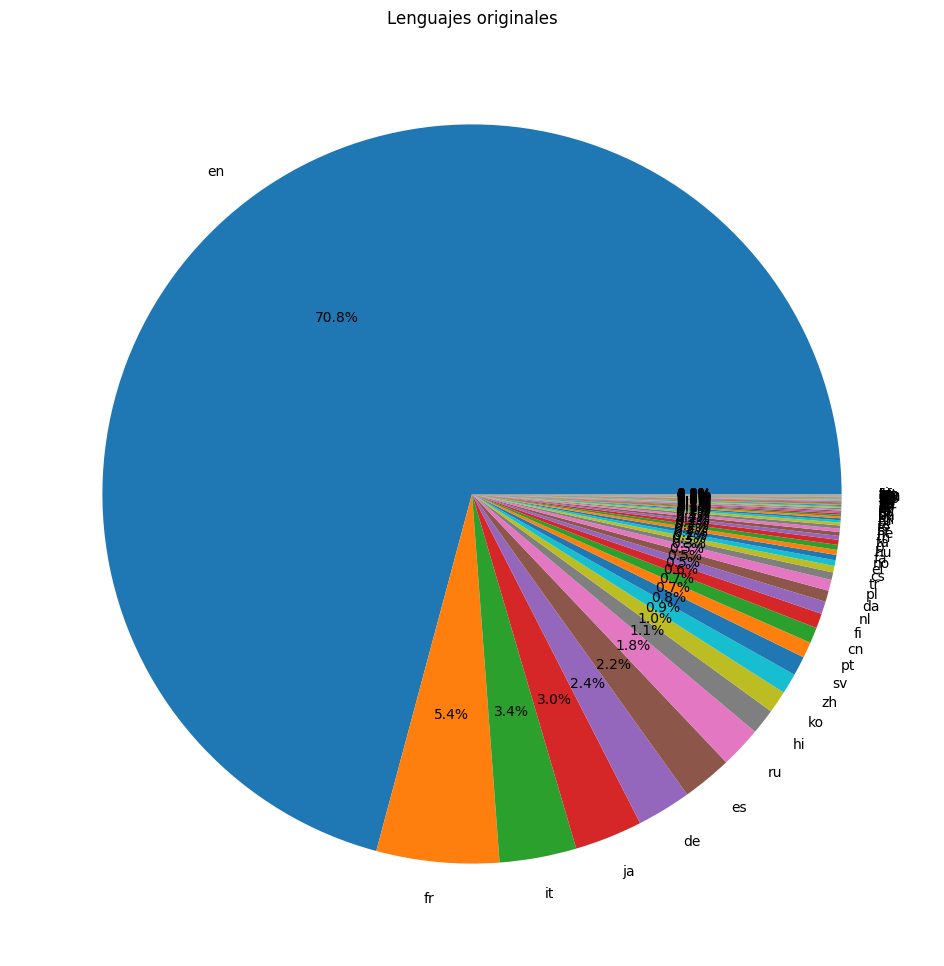

In [70]:
fig,ax=plt.subplots(figsize=(12,12))
plt.pie(porcentaje_lenguaje, labels=porcentaje_lenguaje.index, autopct='%1.1f%%')
plt.title('Lenguajes originales')
plt.show()

In [72]:
genero_counts = df['genero_1'].value_counts()
pct_genero = genero_counts / genero_counts.sum() * 100
pct_genero


genero_1
Drama              26.308728
Comedy             19.397765
Action              9.867148
Documentary         7.487243
Horror              5.760602
0                   5.243709
Crime               3.704030
Thriller            3.662238
Adventure           3.327908
Romance             2.619655
Animation           2.467887
Fantasy             1.548478
Science Fiction     1.420904
Mystery             1.214147
Family              1.152560
Music               1.071177
Western             0.991994
TV Movie            0.855622
War                 0.833627
History             0.611473
Foreign             0.259546
0                   0.193560
Name: count, dtype: float64

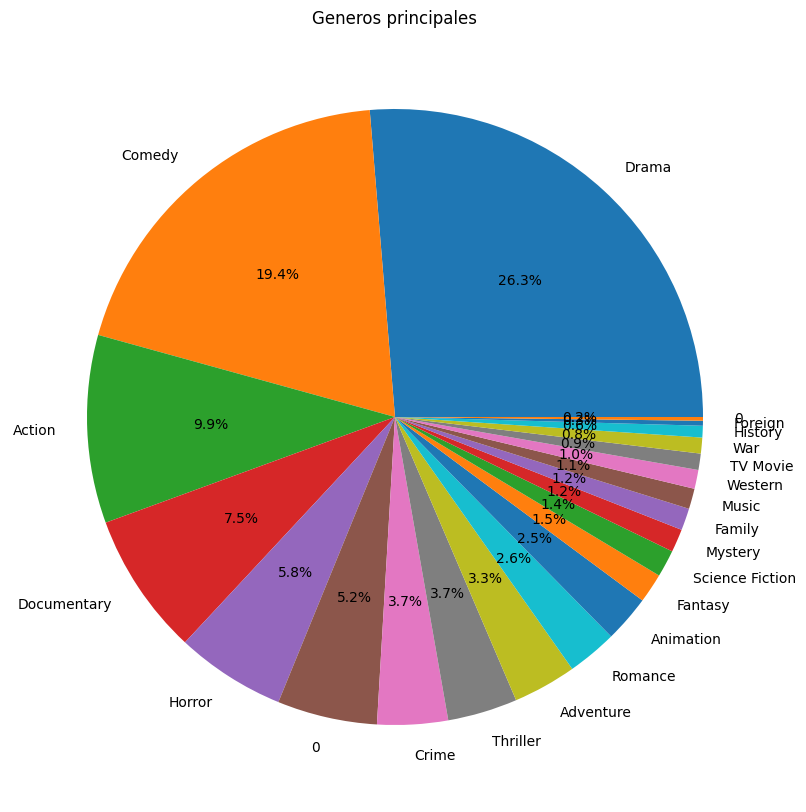

In [75]:
fig,ax=plt.subplots(figsize=(10,10))
plt.pie(pct_genero, labels=pct_genero.index, autopct='%1.1f%%')
plt.title('Generos principales')
plt.show()

In [76]:
genero_counts = df['genero_2'].value_counts()
pct_genero = genero_counts / genero_counts.sum() * 100
pct_genero


genero_2
0                  37.240454
Drama              13.870315
Comedy              7.181506
Romance             6.286292
Thriller            5.540648
Action              3.398293
Crime               3.143146
Adventure           3.107954
Horror              3.077160
Family              2.439293
Science Fiction     2.192944
Mystery             1.698047
Foreign             1.691448
Fantasy             1.687049
Music               1.629861
History             1.407707
Animation           1.359317
Documentary         1.031585
War                 0.809432
Western             0.668661
TV Movie            0.345328
0                   0.193560
Name: count, dtype: float64

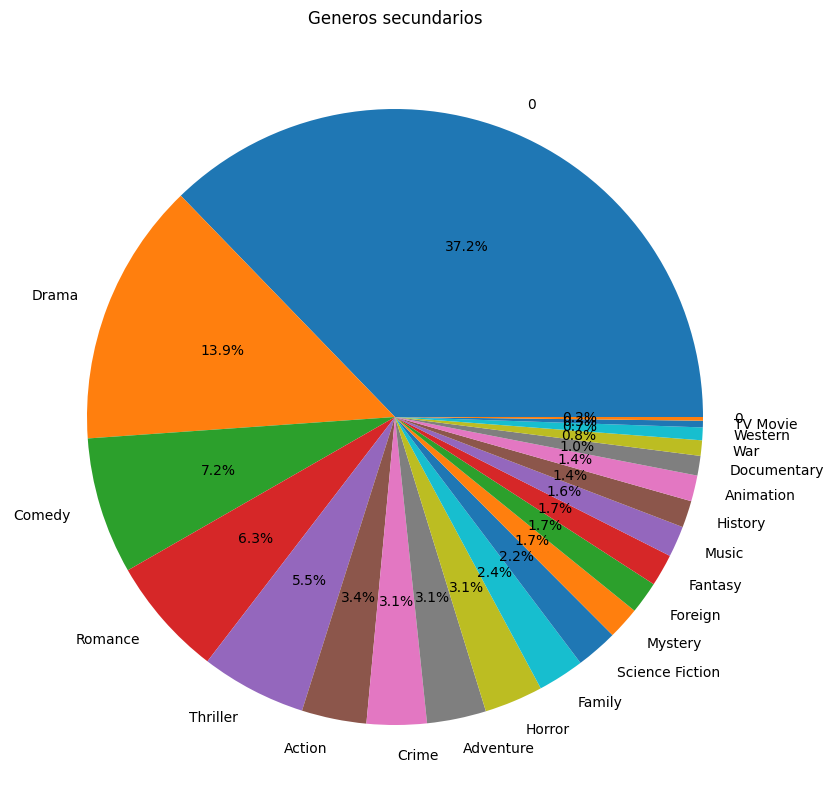

In [78]:
fig,ax=plt.subplots(figsize=(10,10))
plt.pie(pct_genero, labels=pct_genero.index, autopct='%1.1f%%')
plt.title('Generos secundarios')
plt.show() #aqui el 37% es nulo

In [80]:
df.head()

,budget,Id_Pelicula,original_language,overview,popularity,release_date,revenue,runtime,status,tagline,...,produccion_1,Id_produccion_1,produccion_2,Id_produccion_2,produccion_3,Id_produccion_3,codigo_1,pais_1,codigo_2,pais_2
0,30000000.0,862.0,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,1995-10-30,373554033.0,81.0,Released,0,...,Pixar Animation Studios,3.0,0,0.0,0,0.0,US,United States of America,0,0
1,65000000.0,8844.0,en,When siblings Judy and Peter discover an encha...,17.015539,1995-12-15,262797249.0,104.0,Released,Roll the dice and unleash the excitement!,...,TriStar Pictures,559.0,Teitler Film,2550.0,0,0.0,US,United States of America,0,0
2,0.0,15602.0,en,A family wedding reignites the ancient feud be...,11.712900,1995-12-22,0.0,101.0,Released,Still Yelling. Still Fighting. Still Ready for...,...,Warner Bros.,6194.0,Lancaster Gate,19464.0,0,0.0,US,United States of America,0,0
3,16000000.0,31357.0,en,"Cheated on, mistreated and stepped on, the wom...",3.859495,1995-12-22,81452156.0,127.0,Released,Friends are the people who let you be yourself...,...,Twentieth Century Fox Film Corporation,306.0,0,0.0,0,0.0,US,United States of America,0,0
4,0.0,11862.0,en,Just when George Banks has recovered from his ...,8.387519,1995-02-10,76578911.0,106.0,Released,Just When His World Is Back To Normal... He's ...,...,Sandollar Productions,5842.0,Touchstone Pictures,9195.0,0,0.0,US,United States of America,0,0


In [81]:
produccion_counts = df['produccion_1'].value_counts()
pct_prod = produccion_counts / produccion_counts.sum() * 100
pct_prod


produccion_1
0                                         25.945803
Paramount Pictures                         2.195143
Metro-Goldwyn-Mayer (MGM)                  1.874010
Twentieth Century Fox Film Corporation     1.715643
Warner Bros.                               1.665054
                                            ...    
Rich Vein Productions                      0.002200
Lab4 Productions                           0.002200
Trailer Park Partners                      0.002200
Alliance                                   0.002200
Viking Film                                0.002200
Name: count, Length: 10613, dtype: float64

**Nube de palabras**

In [82]:
from wordcloud import WordCloud

In [86]:
df['overview']=df['overview'].astype(str)

In [89]:
texto = ' '.join(df['overview']) #juntamos todos los strings de la columna overview en una sola variable 
print(texto)

Led by Woody, Andy's toys live happily in his room until Andy's birthday brings Buzz Lightyear onto the scene. Afraid of losing his place in Andy's heart, Woody plots against Buzz. But when circumstances separate Buzz and Woody from their owner, the duo eventually learns to put aside their differences. When siblings Judy and Peter discover an enchanted board game that opens the door to a magical world, they unwittingly invite Alan -- an adult who's been trapped inside the game for 26 years -- into their living room. Alan's only hope for freedom is to finish the game, which proves risky as all three find themselves running from giant rhinoceroses, evil monkeys and other terrifying creatures. A family wedding reignites the ancient feud between next-door neighbors and fishing buddies John and Max. Meanwhile, a sultry Italian divorcée opens a restaurant at the local bait shop, alarming the locals who worry she'll scare the fish away. But she's less interested in seafood than she is in cook

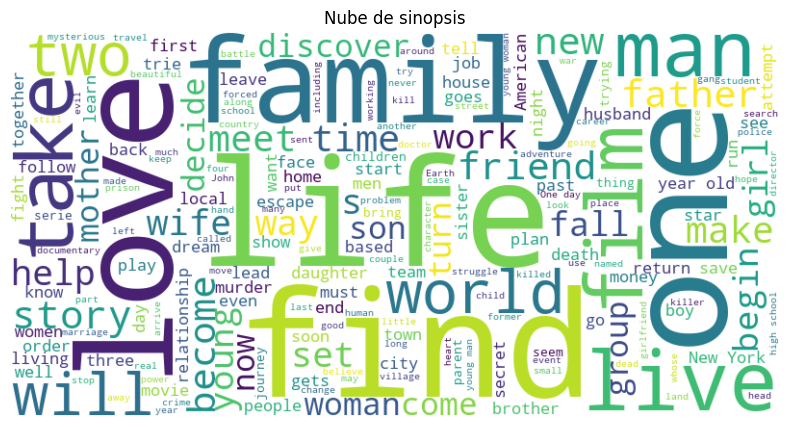

In [95]:
nube = WordCloud(width=800, height=400, background_color='white').generate(texto) #creamos la nube de palabras


plt.figure(figsize=(10, 5))
plt.imshow(nube, interpolation='bilinear') #mostramos la nube con plt
plt.axis('off')  
plt.title('Nube de sinopsis')
plt.show()


In [108]:
df['tagline']=df['tagline'].astype(str)
df['coleccion']=df['coleccion'].astype(str)
df['title']=df['title'].astype(str)

In [109]:
texto_tagline = ' '.join(df['tagline'])

texto_coleccion= ' '.join(df['coleccion'])

texto_titulos = ' '.join(df['title'])


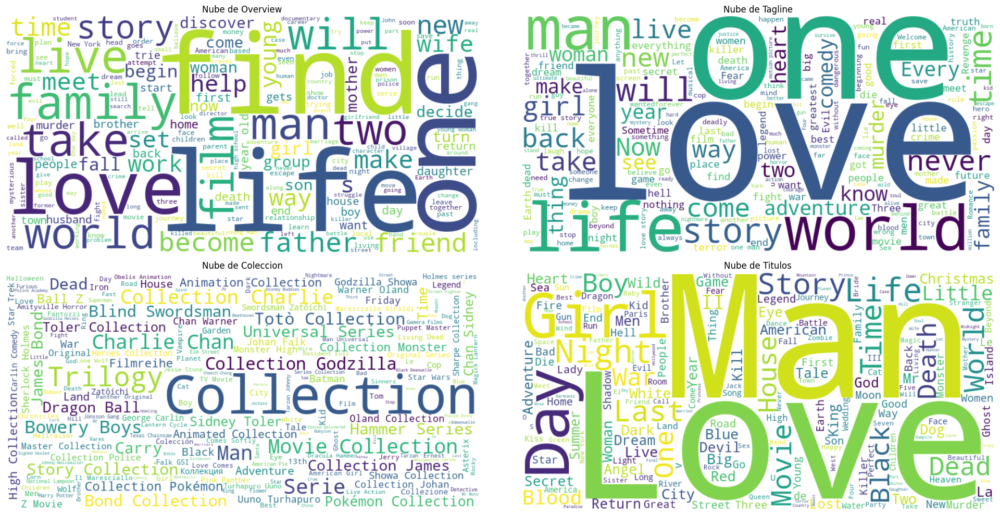

In [121]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))

texts = [texto, texto_tagline, texto_coleccion, texto_titulos] #lista de textos
titulos=['Overview','Tagline','Coleccion','Titulos'] #lista de titulos

for i, ax in enumerate(axes.flat): #creamos y graficamos cada nube
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(texts[i])
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')  
    ax.set_title(f'Nube de {titulos[i]}')

plt.tight_layout() #ajustamos para prevenir que se amontonen
plt.show()
